Dataset:
https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page
Data dictionary:
https://www1.nyc.gov/assets/tlc/downloads/pdf/data_dictionary_trip_records_hvfhs.pdf

# Five boroughs
Brooklyn, Queens, Manhattan, Bronx, and Staten Island

# Data limitation
Compared to Taxi data in which the records include fields capturing pick-up and drop-off dates/times, pick-up and drop-off locations, trip distances, itemized fares, rate types, payment types, and driver-reported passenger counts, Uber data provides far less datum.
For example, itemized fares, rate types, payment types, and driver-reported passenger counts are not provided

# Questions
1. What are the popular pickup and drop off point? (based on district)
1a. Strategy: How can Uber driver maximize their profits, according to 2?
1b. Strategy2: Does it have anything to do with weather, holidays, and major events?
2. Can Uber driver earn reasonably based on travel time, distance, price ? (Price / hours) (price calculated by distance and travel time)

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import geopandas as gpd
import datetime as dt
import folium
import mplcursors
import contextily as ctx
from shapely import wkt
import googlemaps
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [135]:
# convert xlsx to parquet file, via csv as a middle man for better performance (load data faster)
# %timeit
df.to_csv(r'fhvhv_tripdata_2020-01_to_2020-06.csv', index = False)
df_csv = pd.read_csv('fhvhv_tripdata_2020-01_to_2020-06.csv')
df_csv.to_parquet('fhvhv_tripdata_2020-01_to_2020-06.parquet.gzip',compression='gzip')

In [2]:
from pyspark.sql import SQLContext

sqlContext = SQLContext(sc)

parquetFile = sqlContext.read.parquet('fhvhv_tripdata_2020-01_to_2020-06.parquet.gzip')

#parquetFile.columns

In [3]:
from pyspark.sql.functions import to_timestamp, to_date
from pyspark.sql.functions import dayofmonth, dayofweek, hour, minute

pf = parquetFile.select(
    to_timestamp(parquetFile.pickup_datetime, 'yyyy-MM-dd HH:mm:ss').alias('pickup'),
    to_timestamp(parquetFile.dropoff_datetime, 'yyyy-MM-dd HH:mm:ss').alias('dropoff'),
    (to_timestamp(parquetFile.dropoff_datetime, 'yyyy-MM-dd HH:mm:ss').cast('long') \
     - to_timestamp(parquetFile.pickup_datetime, 'yyyy-MM-dd HH:mm:ss').cast('long')).alias('travel_time_seconds'),
    parquetFile.DOLocationID,
    parquetFile.PULocationID,
    parquetFile.SR_Flag,
    to_date(parquetFile.pickup_datetime).alias('pickup_date')
)

pf = pf.withColumn('dayofweek', dayofweek(pf.pickup_date))
pf = pf.withColumn('dayofmonth', dayofmonth(pf.pickup_date))
pf = pf.withColumn('hour', hour(pf.pickup))
pf = pf.withColumn('minute', minute(pf.pickup))
# pf.select(pf.minute, pf.hour, pf.dayofweek, pf.dayofmonth, pf.pickup_date).distinct().show(10)

In [4]:
pf.show(2)

+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+
|             pickup|            dropoff|travel_time_seconds|DOLocationID|PULocationID|SR_Flag|pickup_date|dayofweek|dayofmonth|hour|minute|
+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+
|2020-05-01 00:41:02|2020-05-01 01:08:04|               1622|          69|         142|    0.0| 2020-05-01|        6|         1|   0|    41|
|2020-05-01 00:13:27|2020-05-01 00:27:20|                833|         254|         126|    0.0| 2020-05-01|        6|         1|   0|    13|
+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+
only showing top 2 rows



In [5]:
pf.columns

['pickup',
 'dropoff',
 'travel_time_seconds',
 'DOLocationID',
 'PULocationID',
 'SR_Flag',
 'pickup_date',
 'dayofweek',
 'dayofmonth',
 'hour',
 'minute']

In [6]:
from pyspark.sql.types import StringType
from pyspark.sql.functions import udf


def time_period(hour):
    if (hour >= 0 and hour < 7):
        return 'Early Morning'
    elif (hour >= 7 and hour <= 10):
        return 'AM Peak'
    elif (hour > 10 and hour <= 16):
        return 'Midday'
    elif (hour > 16 and hour <= 19):
        return 'PM Peak'
    else:
        return 'Evening'
    
spark_time_period = udf(lambda hour: time_period(hour), StringType())

pf = pf.withColumn('time_period', spark_time_period(pf.hour))
pf.show(5)


+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+-------------+
|             pickup|            dropoff|travel_time_seconds|DOLocationID|PULocationID|SR_Flag|pickup_date|dayofweek|dayofmonth|hour|minute|  time_period|
+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+-------------+
|2020-05-01 00:41:02|2020-05-01 01:08:04|               1622|          69|         142|    0.0| 2020-05-01|        6|         1|   0|    41|Early Morning|
|2020-05-01 00:13:27|2020-05-01 00:27:20|                833|         254|         126|    0.0| 2020-05-01|        6|         1|   0|    13|Early Morning|
|2020-05-01 00:29:50|2020-05-01 01:01:52|               1922|         265|         254|    0.0| 2020-05-01|        6|         1|   0|    29|Early Morning|
|2020-05-01 00:24:47|2020-05-01 00:56:04|               1877|         

In [7]:
pf.filter(pf.dayofweek == 2).show(2)

+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+-------------+
|             pickup|            dropoff|travel_time_seconds|DOLocationID|PULocationID|SR_Flag|pickup_date|dayofweek|dayofmonth|hour|minute|  time_period|
+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+-------------+
|2020-05-04 00:09:37|2020-05-04 00:16:24|                407|         169|          94|    0.0| 2020-05-04|        2|         4|   0|     9|Early Morning|
|2020-05-04 00:30:55|2020-05-04 00:46:51|                956|         265|         235|    0.0| 2020-05-04|        2|         4|   0|    30|Early Morning|
+-------------------+-------------------+-------------------+------------+------------+-------+-----------+---------+----------+----+------+-------------+
only showing top 2 rows



In [76]:
time_period_schedule = pf.groupby([pf.dayofweek, pf.time_period]).count()
collected = time_period_schedule.collect()

In [77]:
time_period_df = pd.DataFrame(collected)
time_period_df = time_period_df.rename(columns={0: "dayofweek", 1: "time_period", 2: "counts"}).pivot("dayofweek", "time_period", "counts")

In [101]:
%matplotlib widget

weekDays = ("Sunday", "Monday","Tuesday","Wednesday","Thursday","Friday","Saturday")
f, ax = plt.subplots(1, figsize=(12, 8))
sns.heatmap(time_period_df,  linewidths=.5, ax=ax, cmap="YlOrRd", yticklabels = weekDays)
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [11]:
hour_schedule = pf.groupby([pf.dayofweek, pf.hour]).count()
collected = hour_schedule.collect()
hour_df = pd.DataFrame(collected)
hour_df = hour_df.rename(columns={0: "dayofweek", 1: "hour", 2: "counts"}).pivot("dayofweek", "hour", "counts")

In [98]:
conda list

# packages in environment at /Users/miki/anaconda3/envs/uber:
#
# Name                    Version                   Build  Channel
affine                    2.3.0                      py_0    conda-forge
appnope                   0.1.0           py38h32f6830_1001    conda-forge
argon2-cffi               20.1.0           py38h4d0b108_1    conda-forge
async_generator           1.10                       py_0    conda-forge
attrs                     20.2.0             pyh9f0ad1d_0    conda-forge
backcall                  0.2.0              pyh9f0ad1d_0    conda-forge
backports                 1.0                        py_2    conda-forge
backports.functools_lru_cache 1.6.1                      py_0    conda-forge
bleach                    3.1.5              pyh9f0ad1d_0    conda-forge
boost-cpp                 1.72.0               hdf9ef73_0    conda-forge
branca                    0.4.1                      py_0    conda-forge
brotlipy                  0.7.0           py38h64e0658_1000 


Note: you may need to restart the kernel to use updated packages.


In [100]:
%matplotlib widget

weekDays = ("Sunday", "Monday","Tuesday","Wednesday","Thursday","Friday","Saturday")
f, ax = plt.subplots(1, figsize=(12, 8))
sns.heatmap(hour_df,  linewidths=.5, ax=ax, cmap="YlOrRd", yticklabels = weekDays)
plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [13]:
# URL: https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc
zone = pd.read_csv('taxi+_zone_lookup.csv')
zone_dict = dict([(i,j) for i,j in zip(zone.LocationID, zone.Zone)])
zone_dict

{1: 'Newark Airport',
 2: 'Jamaica Bay',
 3: 'Allerton/Pelham Gardens',
 4: 'Alphabet City',
 5: 'Arden Heights',
 6: 'Arrochar/Fort Wadsworth',
 7: 'Astoria',
 8: 'Astoria Park',
 9: 'Auburndale',
 10: 'Baisley Park',
 11: 'Bath Beach',
 12: 'Battery Park',
 13: 'Battery Park City',
 14: 'Bay Ridge',
 15: 'Bay Terrace/Fort Totten',
 16: 'Bayside',
 17: 'Bedford',
 18: 'Bedford Park',
 19: 'Bellerose',
 20: 'Belmont',
 21: 'Bensonhurst East',
 22: 'Bensonhurst West',
 23: 'Bloomfield/Emerson Hill',
 24: 'Bloomingdale',
 25: 'Boerum Hill',
 26: 'Borough Park',
 27: 'Breezy Point/Fort Tilden/Riis Beach',
 28: 'Briarwood/Jamaica Hills',
 29: 'Brighton Beach',
 30: 'Broad Channel',
 31: 'Bronx Park',
 32: 'Bronxdale',
 33: 'Brooklyn Heights',
 34: 'Brooklyn Navy Yard',
 35: 'Brownsville',
 36: 'Bushwick North',
 37: 'Bushwick South',
 38: 'Cambria Heights',
 39: 'Canarsie',
 40: 'Carroll Gardens',
 41: 'Central Harlem',
 42: 'Central Harlem North',
 43: 'Central Park',
 44: 'Charleston/Tot

In [14]:
for i in range(1,len(zone_dict)):
    if 'Airport' in zone_dict[i]:
        print(i, zone_dict[i])

1 Newark Airport
132 JFK Airport
138 LaGuardia Airport


In [15]:
new_york_polygon = pd.read_csv('taxi_zones.csv')
new_york_polygon.tail()

,OBJECTID,Shape_Leng,the_geom,Shape_Area,zone,LocationID,borough
258,256,0.067915,MULTIPOLYGON (((-73.95834207500002 40.71330630...,0.000169,Williamsburg (South Side),256,Brooklyn
259,259,0.126750,MULTIPOLYGON (((-73.85107116191898 40.91037152...,0.000395,Woodlawn/Wakefield,259,Bronx
260,260,0.133514,MULTIPOLYGON (((-73.90175373399988 40.76077547...,0.000422,Woodside,260,Queens
261,261,0.027120,MULTIPOLYGON (((-74.01332610899988 40.70503078...,0.000034,World Trade Center,261,Manhattan
262,262,0.049064,MULTIPOLYGON (((-73.94383256699986 40.78285908...,0.000122,Yorkville East,262,Manhattan


In [16]:
def get_coordinates(new_york):
    coordinates = new_york.split(',')[0].split('(((')[1].split()
    longitude = coordinates[0]
    latitude = coordinates[1]
    return float(latitude), float(longitude)

new_york_polygon['coordinates'] = new_york_polygon['the_geom'].apply(get_coordinates)

In [17]:
zone_coordinates = dict([(i,j) for i,j in zip(new_york_polygon.LocationID, new_york_polygon.coordinates)])
# URL: http://geojson.io/#map=12/40.7656/-73.9442
zone_coordinates[263] = (-73.949208,40.776223) # additional info from https://www.findlatitudeandlongitude.com/l/Yorkville+West.ny/5210343/
zone_coordinates

{1: (40.694995999999904, -74.18445299999996),
 2: (40.63898704717672, -73.82337597260663),
 3: (40.87134223399991, -73.84792614099985),
 4: (40.72582128133706, -73.97177410965318),
 5: (40.5625680859999, -74.17421738099989),
 6: (40.60219816599994, -74.06367318899999),
 7: (40.767520316999864, -73.90413637799996),
 8: (40.775128911999936, -73.92334041500001),
 9: (40.76103651599987, -73.78502434699996),
 24: (40.7987185259999, -73.95953658899997),
 10: (40.68999429299992, -73.78326624999988),
 11: (40.60303462599993, -74.00109809499993),
 12: (40.704833087999944, -74.01565756599994),
 13: (40.7190576729999, -74.01244109299991),
 18: (40.86638287399992, -73.88513907699999),
 25: (40.689146163999936, -73.98155298299992),
 14: (40.644313932981866, -74.03407329297129),
 15: (40.79659824126783, -73.7774039129087),
 22: (40.62427426799996, -73.99254973599997),
 23: (40.63501686464005, -74.19568609223377),
 16: (40.77910542899993, -73.7685730499999),
 17: (40.701424434999886, -73.943064068999

In [18]:
# # Calculate driving distance
# location = pf.groupby([pf.PULocationID, pf.DOLocationID]).count()
# collected = location.collect()
# ride_trip = pd.DataFrame(collected)
# ride_trip.drop_duplicates(inplace=True)

In [19]:
# ride_trip.rename(columns={0: "PULocationID", 1: "DOLocationID", 2: "counts"}, inplace = True)
# ride_trip.head()

In [20]:
# ride_trip['PUCoordinates'] = ride_trip['PULocationID'].map(zone_coordinates)
# ride_trip['DOCoordinates'] = ride_trip['DOLocationID'].map(zone_coordinates)
# ride_trip.sort_values(by='counts', ascending = False, inplace = True)

In [21]:
# ride_trip.isnull().sum()

In [22]:
# ride_trip.head()

In [23]:
# API_key = 'Your API key'
# gmap = googlemaps.Client(key=API_key)

In [24]:
# import time
# import math
# def get_distance_matrix(df):
#     origin = df['PUCoordinates']
#     destination = df['DOCoordinates']
#     time.sleep(0.1)
#     if (isinstance(origin, tuple) and isinstance(destination, tuple)):
#         try:
#             result = gmap.distance_matrix(origin, destination, mode='driving')
#             return result
#         except:
#             return 0
#     else:
#         return 0

In [25]:
# ride_trip['google_info'] = ride_trip.apply(get_distance_matrix, axis = 1)

In [26]:
# export_csv = ride_trip.to_csv(r'ride_trip_info.csv')

In [27]:
ride_trip = sqlContext.read.csv('ride_trip_info.csv', header=True)
ride_trip.select('PULocationID', 'DOLocationID', 'PUCoordinates', 'DOCoordinates').show(2)

+------------+------------+--------------------+--------------------+
|PULocationID|DOLocationID|       PUCoordinates|       DOCoordinates|
+------------+------------+--------------------+--------------------+
|          76|          76|(40.6791769849998...|(40.6791769849998...|
|          26|          26|(40.6414786819999...|(40.6414786819999...|
+------------+------------+--------------------+--------------------+
only showing top 2 rows



In [28]:
from pyspark.sql.types import FloatType
from pyspark.sql.functions import udf

def get_distance(result):
    result = eval(result)
    if (result != 0 and result['rows'][0]['elements'][0].get('distance') is not None):
        distance = result['rows'][0]['elements'][0]['distance']['value']
        return distance/1000
    else:
        return None

def get_duration(result):
    result = eval(result)
    if (result != 0  and result['rows'][0]['elements'][0].get('duration') is not None):
        duration = result['rows'][0]['elements'][0]['duration']['value']
        return duration/60
    else:
        return None
    

extract_distance = udf(lambda google_info: get_distance(google_info), FloatType())
extract_duration = udf(lambda google_info: get_duration(google_info), FloatType())

In [29]:
ride_trip = ride_trip.withColumn('distance_km', extract_distance(ride_trip['google_info']))
ride_trip = ride_trip.withColumn('duration_min', extract_duration(ride_trip['google_info']))

ride_trip = ride_trip.select("PULocationID", "DOLocationID", "distance_km", "duration_min").distinct()

In [30]:
ride_trip.count()

61511

In [31]:
data = pf.join(ride_trip, ["PULocationID", "DOLocationID"])
data.show(10)

+------------+------------+-------------------+-------------------+-------------------+-------+-----------+---------+----------+----+------+-------------+-----------+------------+
|PULocationID|DOLocationID|             pickup|            dropoff|travel_time_seconds|SR_Flag|pickup_date|dayofweek|dayofmonth|hour|minute|  time_period|distance_km|duration_min|
+------------+------------+-------------------+-------------------+-------------------+-------+-----------+---------+----------+----+------+-------------+-----------+------------+
|         142|          69|2020-05-01 00:41:02|2020-05-01 01:08:04|               1622|    0.0| 2020-05-01|        6|         1|   0|    41|Early Morning|     17.156|        24.6|
|         126|         254|2020-05-01 00:13:27|2020-05-01 00:27:20|                833|    0.0| 2020-05-01|        6|         1|   0|    13|Early Morning|       9.33|   18.333334|
|         254|         265|2020-05-01 00:29:50|2020-05-01 01:01:52|               1922|    0.0| 2020

In [32]:
data.count()

52735184

In [33]:
# Source UberX: https://www.investopedia.com/articles/personal-finance/021015/uber-versus-yellow-cabs-new-york-city.asp
base_fare = 2.55
per_minute = 0.35
per_mile = 1.75
min_fare = 7

estimated_fare = base_fare + data.duration_min * per_minute + data.distance_km * 0.6213 * per_mile

In [34]:
example_estimated_fare = base_fare + (11 * per_minute) + (2.6*0.6213*per_mile)
example_estimated_fare

9.226915

In [35]:
data = data.withColumn('estimated_fare', estimated_fare)

In [36]:
hourly_rate = data.estimated_fare / (data.duration_min/ 60)

In [37]:
data = data.withColumn('hourly_rate_USD', hourly_rate)

In [38]:
data.show(10)

+------------+------------+-------------------+-------------------+-------------------+-------+-----------+---------+----------+----+------+-------------+-----------+------------+------------------+------------------+
|PULocationID|DOLocationID|             pickup|            dropoff|travel_time_seconds|SR_Flag|pickup_date|dayofweek|dayofmonth|hour|minute|  time_period|distance_km|duration_min|    estimated_fare|   hourly_rate_USD|
+------------+------------+-------------------+-------------------+-------------------+-------+-----------+---------+----------+----+------+-------------+-----------+------------+------------------+------------------+
|         142|          69|2020-05-01 00:41:02|2020-05-01 01:08:04|               1622|    0.0| 2020-05-01|        6|         1|   0|    41|Early Morning|     17.156|        24.6|29.813290182828904|  72.7153407817493|
|         126|         254|2020-05-01 00:13:27|2020-05-01 00:27:20|                833|    0.0| 2020-05-01|        6|         1|

In [39]:
data.filter((data.PULocationID == 129) & (data.DOLocationID == 82)).agg({"travel_time_seconds" :"avg"}).show()

+------------------------+
|avg(travel_time_seconds)|
+------------------------+
|       596.3323843759802|
+------------------------+



In [40]:
data.filter("hourly_rate_USD is not null").describe('hourly_rate_USD').show()

+-------+------------------+
|summary|   hourly_rate_USD|
+-------+------------------+
|  count|          46696376|
|   mean|  68.1936969291813|
| stddev| 42.11805065438414|
|    min|42.560776621747166|
|    max| 3095.351984110817|
+-------+------------------+



In [41]:
quantiles = data.select(["hourly_rate_usd", "pickup_date"]).filter("hourly_rate_USD is not null")\
.approxQuantile("hourly_rate_USD", [0.25, 0.5, 0.75], 0.025)
quantiles

[54.92534162215543, 63.325052341365506, 75.39064631797521]

In [42]:
data.filter("distance_km is not null").describe('distance_km').show()

+-------+-----------------+
|summary|      distance_km|
+-------+-----------------+
|  count|         50725972|
|   mean|6.878968642170894|
| stddev|6.557894776129921|
|    min|              0.0|
|    max|           76.763|
+-------+-----------------+



In [43]:
distance_quantiles = data.select(["distance_km", "pickup_date"]).filter("distance_km is not null").approxQuantile("distance_km", [0.25, 0.5, 0.75], 0.05)
distance_quantiles

[2.4000000953674316, 4.502999782562256, 8.970000267028809]

In [44]:
distance_quantiles

[2.4000000953674316, 4.502999782562256, 8.970000267028809]

In [45]:
data.filter("travel_time_seconds is not null").describe('travel_time_seconds').show()

+-------+-------------------+
|summary|travel_time_seconds|
+-------+-------------------+
|  count|           52735184|
|   mean|  975.2517380616326|
| stddev|  668.4808285058435|
|    min|                  0|
|    max|              72093|
+-------+-------------------+



In [46]:
travel_time_seconds_quantiles = data.select(["travel_time_seconds", "pickup_date"]).filter("travel_time_seconds is not null").approxQuantile("travel_time_seconds", [0.25, 0.5, 0.75], 0.05)

In [47]:
travel_time_seconds_quantiles

[500.0, 768.0, 1200.0]

In [48]:
summary = data.select(data.pickup_date, data.hour,data.PULocationID, data.DOLocationID,data.travel_time_seconds, data.duration_min, data.estimated_fare, data.hourly_rate_USD).distinct().show(10)

+-----------+----+------------+------------+-------------------+------------+-----------------+------------------+
|pickup_date|hour|PULocationID|DOLocationID|travel_time_seconds|duration_min|   estimated_fare|   hourly_rate_USD|
+-----------+----+------------+------------+-------------------+------------+-----------------+------------------+
| 2020-05-18|   5|           1|           1|                614|         0.0|             2.55|              null|
| 2020-02-05|  15|          13|           1|               2411|   21.116667|31.74939594168663| 90.21138492645116|
| 2020-03-05|  11|          13|           1|               1609|   21.116667|31.74939594168663| 90.21138492645116|
| 2020-03-05|  14|          13|           1|               2357|   21.116667|31.74939594168663| 90.21138492645116|
| 2020-03-16|   7|          13|           1|               2135|   21.116667|31.74939594168663| 90.21138492645116|
| 2020-05-16|  16|          14|           1|               1702|   31.366667|47.

In [49]:
# Top 10 most popular pick-up location
from pyspark.sql import functions
most_pick_up = pf.groupby(pf.PULocationID).count().orderBy(functions.col("count").desc()).limit(10)
collected = most_pick_up.collect()
pick_up_count = pd.DataFrame(collected)
pick_up_count.rename(columns={0: "PULocationID", 1: "counts"}, inplace = True)
zone_pd = pd.DataFrame.from_dict(zone)
joined = pick_up_count.merge(zone_pd, left_on="PULocationID", right_on="LocationID")
joined[["PULocationID", "Borough", "Zone", "counts"]]

,PULocationID,Borough,Zone,counts
0,61,Brooklyn,Crown Heights North,855168
1,76,Brooklyn,East New York,687519
2,79,Manhattan,East Village,611765
3,132,Queens,JFK Airport,609634
4,138,Queens,LaGuardia Airport,598407
5,37,Brooklyn,Bushwick South,596288
6,42,Manhattan,Central Harlem North,587589
7,244,Manhattan,Washington Heights South,526249
8,231,Manhattan,TriBeCa/Civic Center,519359
9,161,Manhattan,Midtown Center,504334


In [50]:
# Top 10 most popular drop-off location
most_pick_up = pf.groupby(pf.DOLocationID).count().orderBy(functions.col("count").desc()).limit(10)
collected = most_pick_up.collect()
pick_up_count = pd.DataFrame(collected)
pick_up_count.rename(columns={0: "DOLocationID", 1: "counts"}, inplace = True)
zone_pd = pd.DataFrame.from_dict(zone)
joined = pick_up_count.merge(zone_pd, left_on="DOLocationID", right_on="LocationID")
joined[["DOLocationID", "Borough", "Zone", "counts"]]

,DOLocationID,Borough,Zone,counts
0,265,Unknown,NaN,1475876
1,61,Brooklyn,Crown Heights North,865096
2,132,Queens,JFK Airport,740448
3,76,Brooklyn,East New York,713482
4,138,Queens,LaGuardia Airport,638658
5,37,Brooklyn,Bushwick South,613069
6,42,Manhattan,Central Harlem North,549653
7,244,Manhattan,Washington Heights South,529838
8,79,Manhattan,East Village,525862
9,89,Brooklyn,Flatbush/Ditmas Park,507319


In [51]:
# Top 10 most popular pick-up location during weekends
weekend_pick_up = pf.filter( (pf.dayofweek == 1) | (pf.dayofweek == 7)).groupby([pf.PULocationID]).count().orderBy(functions.col("count").desc()).limit(10)
collected = weekend_pick_up.collect()
pick_up_count = pd.DataFrame(collected)

pick_up_count.rename(columns={0: "PULocationID", 1: "counts"}, inplace = True)
zone_pd = pd.DataFrame.from_dict(zone)
joined = pick_up_count.merge(zone_pd, left_on="PULocationID", right_on="LocationID")
joined[["PULocationID", "Borough", "Zone", "counts"]]

,PULocationID,Borough,Zone,counts
0,61,Brooklyn,Crown Heights North,278221
1,79,Manhattan,East Village,246763
2,37,Brooklyn,Bushwick South,214164
3,76,Brooklyn,East New York,204596
4,42,Manhattan,Central Harlem North,185349
5,148,Manhattan,Lower East Side,183667
6,255,Brooklyn,Williamsburg (North Side),182576
7,132,Queens,JFK Airport,178559
8,7,Queens,Astoria,178400
9,244,Manhattan,Washington Heights South,160538


In [52]:
# Top 10 most popular drop-off location during weekends
weekend_drop_off = pf.filter( (pf.dayofweek == 1) | (pf.dayofweek == 7)).groupby([pf.DOLocationID]).count().orderBy(functions.col("count").desc()).limit(10)
collected = weekend_drop_off.collect()
drop_off_count = pd.DataFrame(collected)

drop_off_count.rename(columns={0: "DOLocationID", 1: "counts"}, inplace = True)
zone_pd = pd.DataFrame.from_dict(zone)
drop_off_joined = drop_off_count.merge(zone_pd, left_on="DOLocationID", right_on="LocationID")
drop_off_joined[["DOLocationID", "Borough", "Zone", "counts"]]

,DOLocationID,Borough,Zone,counts
0,265,Unknown,NaN,418254
1,61,Brooklyn,Crown Heights North,281640
2,37,Brooklyn,Bushwick South,217450
3,79,Manhattan,East Village,211602
4,76,Brooklyn,East New York,211550
5,132,Queens,JFK Airport,209207
6,42,Manhattan,Central Harlem North,174410
7,7,Queens,Astoria,173216
8,225,Brooklyn,Stuyvesant Heights,163232
9,244,Manhattan,Washington Heights South,162756


pick_up_count.sort_values(by='counts', ascending=False, inplace = True)
pick_up_count['PULocation'] = pick_up_count['PULocationID'].map(zone_dict)

In [86]:
most_pick_up = pf.groupby(pf.PULocationID).count()
collected = most_pick_up.collect()
pick_up_count = pd.DataFrame(collected)
pick_up_count.rename(columns={0: "OBJECTID", 1: "counts"}, inplace = True)
new_york = new_york_polygon.merge(pick_up_count, how = 'inner', on = 'OBJECTID', copy = True)

,0,1
0,26,340587
1,29,120583
2,191,131838
3,65,231426
4,222,75110


In [88]:
new_york.head()

,OBJECTID,Shape_Leng,the_geom,Shape_Area,zone,LocationID,borough,coordinates,counts
0,1,0.116357,MULTIPOLYGON (((-74.18445299999996 40.69499599...,0.000782,Newark Airport,1,EWR,"(40.694995999999904, -74.18445299999996)",36
1,2,0.433470,MULTIPOLYGON (((-73.82337597260663 40.63898704...,0.004866,Jamaica Bay,2,Queens,"(40.63898704717672, -73.82337597260663)",80
2,3,0.084341,MULTIPOLYGON (((-73.84792614099985 40.87134223...,0.000314,Allerton/Pelham Gardens,3,Bronx,"(40.87134223399991, -73.84792614099985)",142835
3,4,0.043567,MULTIPOLYGON (((-73.97177410965318 40.72582128...,0.000112,Alphabet City,4,Manhattan,"(40.72582128133706, -73.97177410965318)",161544
4,5,0.092146,MULTIPOLYGON (((-74.17421738099989 40.56256808...,0.000498,Arden Heights,5,Staten Island,"(40.5625680859999, -74.17421738099989)",14795


In [89]:
new_york = new_york[['LocationID','zone', 'the_geom', 'counts' ]]
new_york.rename(columns={'zone': "PULocation"}, inplace = True)
new_york.head()

,LocationID,PULocation,the_geom,counts
0,1,Newark Airport,MULTIPOLYGON (((-74.18445299999996 40.69499599...,36
1,2,Jamaica Bay,MULTIPOLYGON (((-73.82337597260663 40.63898704...,80
2,3,Allerton/Pelham Gardens,MULTIPOLYGON (((-73.84792614099985 40.87134223...,142835
3,4,Alphabet City,MULTIPOLYGON (((-73.97177410965318 40.72582128...,161544
4,5,Arden Heights,MULTIPOLYGON (((-74.17421738099989 40.56256808...,14795


In [90]:
new_york.crs = 'epsg:4326'
new_york['geometry'] = new_york['the_geom'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(new_york, crs='epsg:4326')

# unit test
coordinates = new_york.the_geom[3].split(',')[0].split('(((')[1].split()
longitude = coordinates[0]
lattitude = coordinates[1]
print((float(longitude), float(lattitude)))

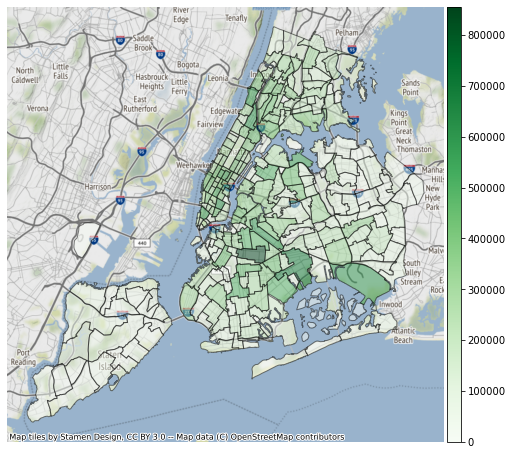

In [91]:
%matplotlib inline
gdf = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(1, figsize = (16,8))
gdf.plot(column='counts', ax=ax, cmap = 'Greens', alpha=0.5, edgecolor = 'black')

# set an axis for the color bar
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='3%', pad = 0.05)

# color bar
vmax = gdf.counts.max()
mappable = plt.cm.ScalarMappable(cmap='Greens', norm = plt.Normalize(vmin=0, vmax = vmax))
cbar = fig.colorbar(mappable, cax=cax)
ax.axis('off')
cursor = mplcursors.cursor(hover=True)
ctx.add_basemap(ax)

In [92]:
map = folium.Map(location=[40.758896, -73.985130], zoom_start=11)
folium.Choropleth(
    geo_data=gdf,
    name='choropleth',
    data=new_york,
    columns=['PULocation', 'counts'],
    key_on='feature.properties.PULocation',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    line_opacity=0.8,
    legend_name='Ride Count'
).add_to(map)
map

In [93]:
# URL: https://medium.com/datadriveninvestor/visualising-geospatial-data-with-python-d3b1c519f31
# Create Folium plot
map.save('plot_data.html')
# Import the Folium interactive html file
from IPython.display import HTML
HTML('<iframe src=plot_data.html width=700 height=450></iframe>')

/Users/miki/anaconda3/envs/uber/lib/python3.8/site-packages/IPython/core/display.py:717: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [60]:
# URL: https://www.visualcrossing.com/weather/weather-data-services?pln=plan_GqkbrxoxU5fY8e#/loadingscreen
new_york_weather = pd.read_csv('New_York_history_weather_data_01012020_31_032020.csv')
new_york_weather.columns

Index(['Location', 'Address', 'Resolved Address', 'Date time',
       'Maximum Temperature', 'Minimum Temperature', 'Temperature',
       'Wind Chill', 'Heat Index', 'Precipitation', 'Snow Depth', 'Wind Speed',
       'Wind Gust', 'Cloud Cover', 'Relative Humidity', 'Conditions'],
      dtype='object')

In [61]:
weather_data_view = new_york_weather[['Date time', 'Maximum Temperature', 'Minimum Temperature', 'Temperature','Precipitation', 'Snow Depth', 'Conditions' ]]

In [62]:
weather_data_view['date'] = pd.to_datetime(weather_data_view['Date time'], format="%m/%d/%Y")
weather_data_view.drop(columns =["Date time"], inplace = True)
# Fill missing values with 0
weather_data_view.fillna({'Snow Depth':0}, inplace = True)

<ipython-input-62-c9b686416f11>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_data_view['date'] = pd.to_datetime(weather_data_view['Date time'], format="%m/%d/%Y")
/Users/miki/anaconda3/envs/uber/lib/python3.8/site-packages/pandas/core/frame.py:4162: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(
/Users/miki/anaconda3/envs/uber/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

In [63]:
weather_data_view.sort_values(by=['Precipitation'],ascending=False).head()

,Maximum Temperature,Minimum Temperature,Temperature,Precipitation,Snow Depth,Conditions,date
82,42.4,38.5,39.4,0.52,0.0,"Rain, Partially cloudy",2020-03-23
41,48.1,43.9,45.6,0.21,0.0,"Rain, Partially cloudy",2020-02-11
40,45.7,41.9,43.5,0.18,0.0,"Rain, Partially cloudy",2020-02-10
43,43.1,36.9,40.3,0.15,0.0,"Rain, Partially cloudy",2020-02-13
17,37.2,22.2,27.9,0.14,0.0,"Rain, Clear",2020-01-18


In [64]:
pick_up_by_date = pf.groupby(pf.pickup_date).count()
collected = pick_up_by_date.collect()
pick_up_count = pd.DataFrame(collected)

In [65]:
def thousands_format(x, pos):
    """
    Args are the value and tick position. 
    Returns number of thousands with one decimal, and K in lieu of 3 zeros.
    """
    return '{:.0f}{}'.format(x * 1e-3, 'K') #old syntax: '%1.0fK' % (x * 1e-3)

In [66]:
pick_up_count.rename(columns={0: "pickup_date", 1: "counts"}, inplace = True)
beginning = pick_up_count.pickup_date.min()
end = pick_up_count.pickup_date.max()

In [67]:
#Get all federal holidays in the period
from pandas.tseries.holiday import USFederalHolidayCalendar

#if return_name is True, then name is series value and date is the series index, otherwise date is series value.
holidays = USFederalHolidayCalendar().holidays(beginning, end, return_name = True) 
holidays

2020-01-01                 New Years Day
2020-01-20    Martin Luther King Jr. Day
2020-02-17                Presidents Day
2020-05-25                  Memorial Day
dtype: object

In [68]:
pick_up_count['pickup_date'] = pd.to_datetime(pick_up_count['pickup_date'], format="%Y-%m-%d")

In [69]:
pick_up_mean = pick_up_count[pick_up_count["pickup_date"] <= "2020-03-01"]['counts'].mean()
pick_up_mean

506507.0

Text(-120, -60, 'CoronaVirus peak')

<Figure size 432x288 with 0 Axes>

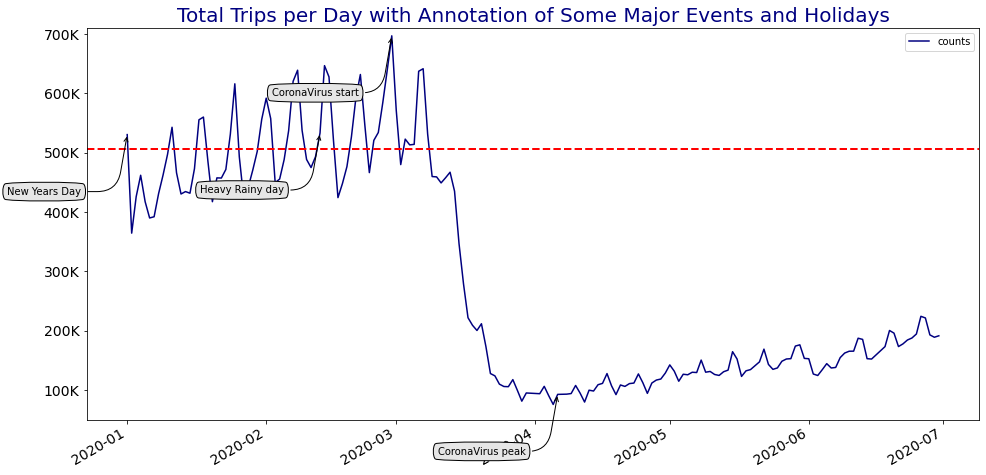

In [70]:
%matplotlib inline
from matplotlib.ticker import FuncFormatter #Call formatter function to format tick values
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox) #Create image box

from matplotlib.patches import Ellipse #Draw ellipse

fig = plt.figure()

ax = pick_up_count.set_index('pickup_date').plot(y='counts', ylim = (50000, 710000), fontsize = 12,  color = 'navy', figsize=(16,8))

formatter = FuncFormatter(thousands_format)
ax.yaxis.set_major_formatter(formatter)

plt.title('Total Trips per Day with Annotation of Some Major Events and Holidays', fontsize= 20, color='navy')
plt.tick_params(labelsize=14)
plt.xlabel('')
plt.axhline(pick_up_mean, color='red', linestyle='dashed', linewidth=2, label="mean")

ax.annotate('New Years Day', xy=(dt.datetime(2020, 1, 1), 530257),  xycoords='data',
            xytext=(-120, -60), textcoords='offset points',
            bbox=dict(boxstyle="round4,pad=.5", fc="0.9"),
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle,angleA=0,angleB=80,rad=20"))

ax.annotate("Heavy Rainy day", xy=(dt.datetime(2020,2,13), 532885),  xycoords='data',
            xytext=(-120, -60), textcoords='offset points',
            bbox=dict(boxstyle="round4,pad=.5", fc="0.9"),
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle,angleA=0,angleB=80,rad=20"))

ax.annotate("CoronaVirus start", xy=(dt.datetime(2020,2,29), 696720),  xycoords='data',
            xytext=(-120, -60), textcoords='offset points',
            bbox=dict(boxstyle="round4,pad=.5", fc="0.9"),
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle,angleA=0,angleB=80,rad=20"))

ax.annotate("CoronaVirus peak", xy=(dt.datetime(2020,4,6), 92514),  xycoords='data',
            xytext=(-120, -60), textcoords='offset points',
            bbox=dict(boxstyle="round4,pad=.5", fc="0.9"),
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle,angleA=0,angleB=80,rad=20"))


In [71]:
# URL: https://data.cityofnewyork.us/Health/COVID-19-Daily-Counts-of-Cases-Hospitalizations-an/rc75-m7u3
covid_19_new_york = pd.read_csv('New_York_COVID-19_Daily_Counts_of_Cases__Hospitalizations__and_Deaths.csv')

In [72]:
covid_19_new_york['TOTAL_CASES'] = covid_19_new_york['CASE_COUNT'].cumsum()
covid_19_new_york[covid_19_new_york.CASE_COUNT == 6377]

,DATE_OF_INTEREST,CASE_COUNT,HOSPITALIZED_COUNT,DEATH_COUNT,TOTAL_CASES
37,04/06/2020 12:00:00 AM,6377,1721,575,96179
